<center><H2>Driver Distraction Detection using Computer Vision</H2></center>

### Import libraries

In [1]:
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing import image_dataset_from_directory
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from IPython.display import display
import cv2

from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D, Dropout
from keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import img_to_array, load_img

In [2]:
# img directory paths
class_names={0: 'safe driving',
      1: 'texting - right',
      2: 'talking on the phone - right',
      3: 'texting - left',
      4: 'talking on the phone - left',
      5: 'operating the radio',
      6: 'drinking',
      7: 'reaching behind',
      8: 'hair and makeup',
      9: 'talking to passenger'}
train_dir = 'G:/MS/Spring sem 2024/CSCI 6527 - Computer Vision/Project/image_data/train'
test_dir =  'G:/MS/Spring sem 2024/CSCI 6527 - Computer Vision/Project/image_data/test'

In [3]:
#Target dimensions and batch size
img_width,img_height=200,200
batch_size = 32

In [4]:
# Create data generators for training, validation, and test sets
train_datagen = ImageDataGenerator(rescale=1./255,              
    rotation_range=15,
    shear_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2)                             
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    subset="training",
    class_mode='categorical')

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    subset="validation",
    class_mode='categorical')


test_data = image_dataset_from_directory(
    test_dir,
    label_mode=None,
    shuffle=False,
    image_size=(200, 200),
    batch_size=32,
)

Found 17943 images belonging to 10 classes.
Found 4481 images belonging to 10 classes.
Found 79726 files belonging to 1 classes.


In [5]:
metadata_df = pd.read_csv("driver_imgs_list.csv")
metadata_df.head()

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [6]:
metadata_df['classname'].value_counts()

c0    2489
c3    2346
c4    2326
c6    2325
c2    2317
c5    2312
c1    2267
c9    2129
c7    2002
c8    1911
Name: classname, dtype: int64

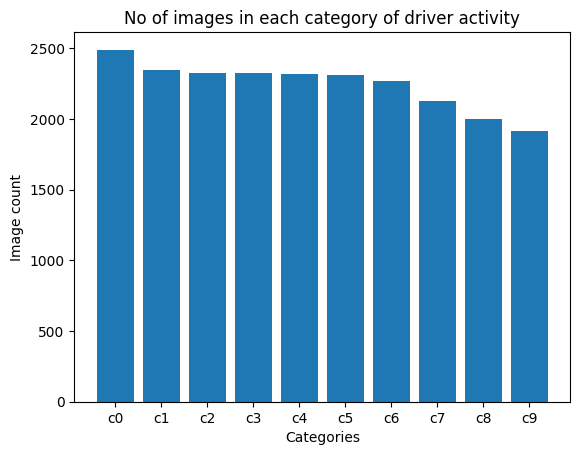

In [15]:
class_counts=metadata_df['classname'].value_counts()
classes=metadata_df['classname'].unique()
plt.bar(classes,class_counts,)
plt.xlabel("Categories")
plt.ylabel("Image count")
plt.title("No of images in each category of driver activity")
plt.show()

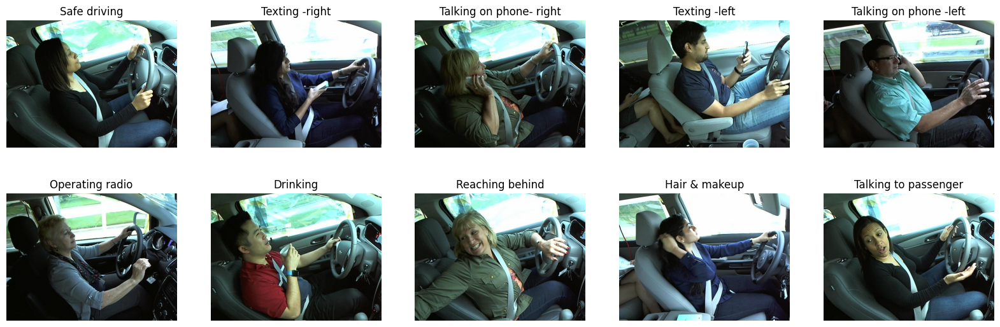

In [11]:
# Representation of images from each category
sample_images = ["image_data/train/c0/img_33727.jpg", "image_data/train/c1/img_29687.jpg", 
                 "image_data/train/c2/img_45603.jpg", "image_data/train/c3/img_52921.jpg", 
                 "image_data/train/c4/img_6192.jpg", "image_data/train/c5/img_17022.jpg", 
                 "image_data/train/c6/img_13013.jpg", "image_data/train/c7/img_53590.jpg", 
                 "image_data/train/c8/img_50137.jpg", "image_data/train/c9/img_6384.jpg"]
category= ["Safe driving", "Texting -right", "Talking on phone- right", "Texting -left", "Talking on phone -left", "Operating radio", "Drinking", "Reaching behind", "Hair & makeup", "Talking to passenger"]

plt.figure(figsize=(20, 10))
columns = 5

for i, image_loc in enumerate(sample_images):
    plt.subplot(len(sample_images)//columns + 1, columns, i + 1)
    image = plt.imread(image_loc)
    plt.title(category[i])
    plt.imshow(image)
    plt.axis('off')

plt.show()


### CNN model for classification

In [108]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
#Early stopping callback function to monitor validation loss 
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
 
# Train the model
history = model.fit(train_generator, steps_per_epoch=len(train_generator), epochs=10, validation_data=val_generator, validation_steps=len(val_generator),callbacks=[early_stopping])

Epoch 1/10
561/561 [==============================] - 5033s 9s/step - loss: 1.4689 - accuracy: 0.4857 - val_loss: 0.5234 - val_accuracy: 0.8366
Epoch 2/10
561/561 [==============================] - 4925s 9s/step - loss: 0.5606 - accuracy: 0.8159 - val_loss: 0.3151 - val_accuracy: 0.9098
Epoch 3/10
561/561 [==============================] - 4853s 9s/step - loss: 0.3441 - accuracy: 0.8893 - val_loss: 0.2034 - val_accuracy: 0.9397
Epoch 4/10
561/561 [==============================] - 4887s 9s/step - loss: 0.2548 - accuracy: 0.9205 - val_loss: 0.1322 - val_accuracy: 0.9634
Epoch 5/10
561/561 [==============================] - 4639s 8s/step - loss: 0.2059 - accuracy: 0.9355 - val_loss: 0.0997 - val_accuracy: 0.9705
Epoch 6/10
561/561 [==============================] - 4685s 8s/step - loss: 0.1811 - accuracy: 0.9444 - val_loss: 0.0905 - val_accuracy: 0.9752
Epoch 7/10
561/561 [==============================] - 4798s 9s/step - loss: 0.1564 - accuracy: 0.9530 - val_loss: 0.0758 - val_accuracy:

In [109]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 48, 48, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 46, 46, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 23, 23, 128)      0

In [110]:
# Evaluate for train generator
train_loss,train_acc = model.evaluate(train_generator , verbose = 0)

print('The accuracy of the model for training data is:',train_acc*100)
print('The Loss of the model for training data is:',train_loss)

The accuracy of the model for training data is: 99.00239706039429
The Loss of the model for training data is: 0.03479116037487984


In [111]:
# Evaluate for val generator
val_loss,val_acc = model.evaluate(val_generator , verbose = 0)

print('The accuracy of the model for validation data is:',val_acc*100)
print('The Loss of the model for validation data is:',val_loss)

The accuracy of the model for validation data is: 98.28163385391235
The Loss of the model for validation data is: 0.06188088282942772


In [17]:
# Save the model
model.save("CNN_model.h5")

In [19]:
#Load the saved cnn model weights
saved_model = tf.keras.models.load_model('CNN_model.h5')

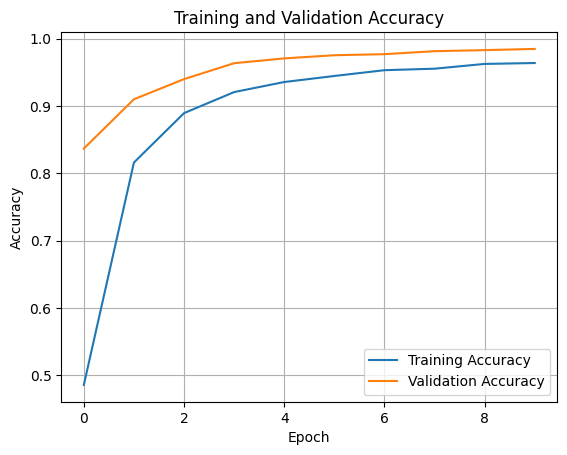

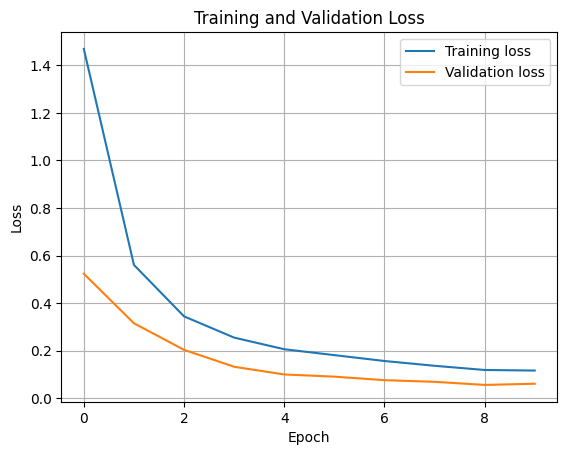

In [112]:
# Plot training and validation accuracy curves
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(labels=['Training Accuracy', 'Validation Accuracy'])
plt.grid(True)
plt.show()

# Plot training and validation loss curves
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(labels=['Training loss', 'Validation loss'])
plt.grid(True)
plt.show()


### Prediction results of test data

In [55]:
import random

saved_model.compile(run_eagerly=True)
test_image_filenames = os.listdir(test_dir)
sample_size = int(0.1 * len(test_image_filenames))  # sample proportion of test data predictions

# Randomly sample test data filenames
sample_files = random.sample(test_image_filenames, sample_size)
test_images = []

# Load and preprocess test images
for image_file in sample_files:
    image_path = os.path.join(test_dir, image_file)
    image = load_img(image_path, target_size=(200, 200))  
    image = img_to_array(image) / 255.0  # Normalize pixel values
    test_images.append(image)
    test_image_filenames.append(image)

# Convert lists to NumPy arrays
test_images = np.array(test_images)

# Make predictions on test images
predictions = saved_model.predict(test_images)

# Convert predicted probabilities to class labels
predicted_labels = [np.argmax(prediction) for prediction in predictions]
predicted_class_names = [class_names[label] for label in predicted_labels]
predictions_df = pd.DataFrame(columns=['Image', 'Predicted_Label'])


for filename, pred_class_name in zip(sample_files, predicted_class_names):
    predictions_df = predictions_df.append({'Image': filename, 'Predicted_Label': pred_class_name}, ignore_index=True)
print(predictions_df.head())

250/250 [==============================] - 77s 302ms/step
           Image       Predicted_Label
0  img_47568.jpg       reaching behind
1  img_10246.jpg       texting - right
2  img_39632.jpg       hair and makeup
3  img_83543.jpg   operating the radio
4  img_66722.jpg  talking to passenger


In [56]:
predictions_df

,Image,Predicted_Label
0,img_47568.jpg,reaching behind
1,img_10246.jpg,texting - right
2,img_39632.jpg,hair and makeup
3,img_83543.jpg,operating the radio
4,img_66722.jpg,talking to passenger
...,...,...
7967,img_50210.jpg,reaching behind
7968,img_49826.jpg,talking to passenger
7969,img_77978.jpg,talking to passenger
7970,img_48056.jpg,texting - right


### Prediction on random input images

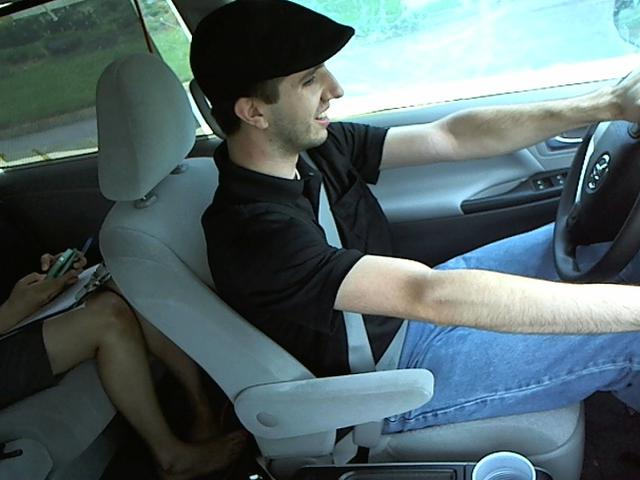

1/1 [==============================] - 0s 97ms/step
Predicted Label: operating the radio


In [105]:
def preprocess_image(image_path, target_size):
    image = Image.open(image_path)
    image = image.resize(target_size)
    image = np.array(image) / 255.0  # Normalize pixel values
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

def predict_image(image_path, model, labels):
    # Preprocessing image 
    input_image = preprocess_image(image_path, target_size=(200, 200))  
    predictions = model.predict(input_image)
    predicted_class_index = np.argmax(predictions)

    # Map the predicted class index to class label
    predicted_label = labels[predicted_class_index]

    return predicted_label

# Testing the prediction function with a new input image
image_path=r"G:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_10.jpg"
image = Image.open(image_path)

# Display the image
display(image)
predicted_label = predict_image(image_path, saved_model, class_names)
print("Predicted Label:", predicted_label)

In [21]:
# Measuring no of correct and incorrect predictions on the image data
correct_predictions = 0
incorrect_predictions = 0
train_predictions_df = pd.DataFrame(columns=['Image', 'Predicted_Label', 'Actual_Label'])
for index, row in metadata_df.iterrows():
    # Extract the numeric part from the classname string (e.g., 'c0' -> 0) and convert it to an integer
    class_number = int(row['classname'][1:])
    image_path = os.path.join(train_dir, row['classname'], row['img'])
    # Predict the class label using our saved CNN model weights
    predicted_label = predict_image(image_path, saved_model, class_names)
    # Get the actual label using the class number as key to the reverse_class_names dictionary
    actual_label = class_names[class_number]
    # Check if the predicted label matches the true label from the metadata
    if predicted_label == actual_label:
        correct_predictions += 1
    else:
        incorrect_predictions += 1
    train_predictions_df = train_predictions_df.append({'Image': row['img'], 
                                                        'Predicted_Label': predicted_label, 
                                                        'Actual_Label': actual_label}, 
                                                       ignore_index=True)

print(f"Correct predictions on training data: {correct_predictions}")
print(f"Incorrect predictions on training data: {incorrect_predictions}")

1/1 [==============================] - 0s 85ms/step
Correct predictions on training data: 22215
Incorrect predictions on training data: 209


In [26]:
train_predictions_df

,Image,Predicted_Label,Actual_Label
0,img_44733.jpg,safe driving,safe driving
1,img_72999.jpg,safe driving,safe driving
2,img_25094.jpg,safe driving,safe driving
3,img_69092.jpg,safe driving,safe driving
4,img_92629.jpg,safe driving,safe driving
...,...,...,...
22419,img_56936.jpg,talking to passenger,talking to passenger
22420,img_46218.jpg,talking to passenger,talking to passenger
22421,img_25946.jpg,talking to passenger,talking to passenger
22422,img_67850.jpg,talking to passenger,talking to passenger


In [82]:
print(f"Correct predictions on training data: {correct_predictions}")
print(f"Incorrect predictions on training data: {incorrect_predictions}")

Correct predictions on training data: 22215
Incorrect predictions on training data: 209


### Object Detection within the vehicle

In [31]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLOv5x model
model = YOLO('yolov5x.pt')
model.info()

# Model training on COCO8 dataset
model.train(data='coco8.yaml', epochs=5, imgsz=640)

PRO TIP 💡 Replace 'model=yolov5x.pt' with new 'model=yolov5xu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

YOLOv5x summary: 493 layers, 97276448 parameters, 0 gradients, 247.3 GFLOPs
Ultralytics YOLOv8.1.18 🚀 Python-3.10.7 torch-1.13.1+cpu CPU (AMD Ryzen 7 5800H with Radeon Graphics)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine\trainer: task=detect, mode=train, model=yolov5x.pt, data=coco8.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0

train: Scanning G:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Blog -3\datasets\coco8\labels\train.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]
val: Scanning G:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Blog -3\datasets\coco8\labels\val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


Plotting labels to runs\detect\train9\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 135 weight(decay=0.0), 142 weight(decay=0.0005), 141 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train9
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5         0G     0.7484      2.416      1.214         32        640: 100%|██████████| 1/1 [00:49<00:00, 49.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.05s/it]

                   all          4         17       0.93      0.806      0.936      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5         0G     0.9214      1.533      1.418         22        640: 100%|██████████| 1/1 [00:17<00:00, 17.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.77s/it]

                   all          4         17       0.93      0.806      0.936      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5         0G     0.8375      1.675      1.348         17        640: 100%|██████████| 1/1 [00:18<00:00, 18.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.58s/it]

                   all          4         17       0.93      0.806      0.937      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5         0G     0.9393      1.696      1.397         33        640: 100%|██████████| 1/1 [00:17<00:00, 17.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.83s/it]

                   all          4         17      0.933      0.805      0.938      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5         0G     0.8463     0.7961      1.135         38        640: 100%|██████████| 1/1 [00:18<00:00, 18.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.96s/it]

                   all          4         17      0.933      0.805      0.939      0.759



5 epochs completed in 0.051 hours.
Optimizer stripped from runs\detect\train9\weights\last.pt, 195.1MB
Optimizer stripped from runs\detect\train9\weights\best.pt, 195.1MB

Validating runs\detect\train9\weights\best.pt...
Ultralytics YOLOv8.1.18 🚀 Python-3.10.7 torch-1.13.1+cpu CPU (AMD Ryzen 7 5800H with Radeon Graphics)
YOLOv5x summary (fused): 358 layers, 97229648 parameters, 0 gradients, 246.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.33s/it]


                   all          4         17      0.934      0.805      0.939      0.759
                person          4         10          1      0.332      0.825      0.569
                   dog          4          1      0.939          1      0.995      0.895
                 horse          4          2      0.944          1      0.995      0.684
              elephant          4          2      0.875        0.5      0.828      0.515
              umbrella          4          1       0.88          1      0.995      0.995
          potted plant          4          1      0.964          1      0.995      0.895
Speed: 2.4ms preprocess, 1310.5ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to runs\detect\train9


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0, 16, 17, 20, 25, 58])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000014E2C594CD0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047

In [47]:
image_path=r"image_data\train\c1\img_12579.jpg"
results = model(image_path)


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\train\c1\img_12579.jpg: 480x640 1 person, 1 car, 1 cell phone, 1113.3ms
Speed: 3.0ms preprocess, 1113.3ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)


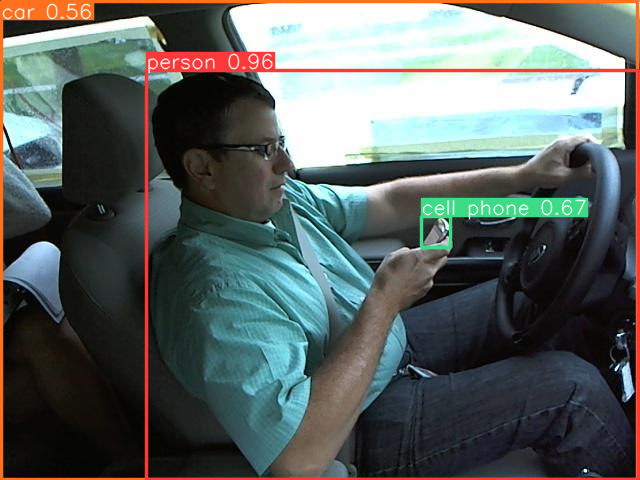

In [48]:
Image.fromarray(results[0].plot()[:,:,::-1])

In [34]:
bottle_count = 0
cup_count = 0
cell_phone_count = 0

for res in results:
    # Get class labels for each detection box
    box = res.boxes
    labels =box.cls.tolist()
    # Count occurrences of specific classes
    bottle_count += labels.count(39)  # Class ID for bottle (Counts the no of bottles)
    cup_count += labels.count(41)     # Class ID for cup (Counts the no of cups)
    cell_phone_count += labels.count(67)  # Class ID for cell phone (Counts the no of cell phones)

# Create a dataframe to store the detection counts
detection_counts = pd.DataFrame({
    "Object type": ["bottle", "cup", "cell_phone"],
    "Count": [bottle_count, cup_count, cell_phone_count]
})

# Display the dataframe
print(detection_counts)

  Object type  Count
0      bottle      0
1         cup      1
2  cell_phone      0


In [84]:
desired_class_ids = [39, 41, 67]
classes = {39: 'Bottle', 41: 'Cup', 67: 'Cell Phone'}
from PIL import ImageFont

font_size = 16  # Adjust the font size as needed
font = ImageFont.truetype("arial.ttf", font_size)

def objectDetectionModel(image_path):
        results = model(image_path)
        original_image = Image.open(image_path)
        draw = ImageDraw.Draw(original_image)

        for result in results:
            # Iterate over each bounding box in the result
            for box in result.boxes:
                # Get the class IDs of the bounding box
                class_id = box.cls[0].item()
                # Check if the class ID is in the desired class IDs
                if class_id in desired_class_ids:
                    #Coordinates of the bounding box and round them
                    coordinates = [round(coord) for coord in box.xyxy[0].tolist()]
                    # Bounding box
                    draw.rectangle(coordinates, outline="blue",width=2)
                    confidence = round(box.conf[0].item(), 2)
                    class_name = classes.get(class_id, 'Unknown')
                    label = f"{class_name}: {confidence}"
                    # Calculate the position to place the text outside the bounding box
                    text_x = coordinates[2] + 5  # padding
                    text_y = coordinates[1]  # Align with the top of the bounding box
                    
                    # Draw the text on the image
                    draw.text((text_x, text_y), label, fill="#E72929", font=font)


        # Annotated image
        display(original_image)

### Working sample outputs

#### Detection on Train data samples


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\train\c6\img_1133.jpg: 480x640 1 person, 1 car, 1 cup, 1 book, 1296.1ms
Speed: 3.0ms preprocess, 1296.1ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


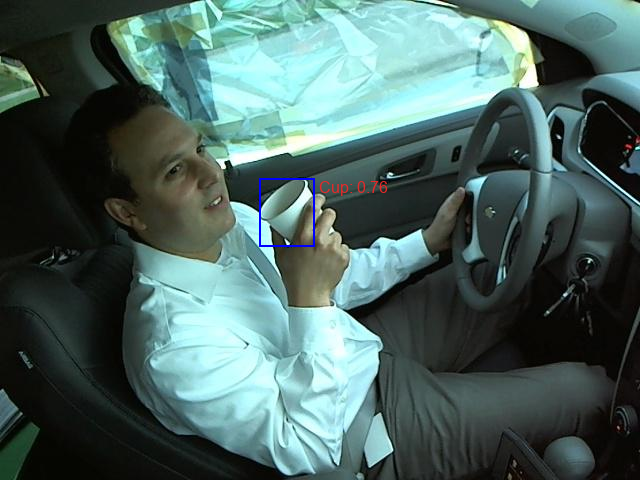


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\train\c6\img_2286.jpg: 480x640 1 person, 1 car, 1 bottle, 1 cup, 1329.4ms
Speed: 2.0ms preprocess, 1329.4ms inference, 11.6ms postprocess per image at shape (1, 3, 480, 640)


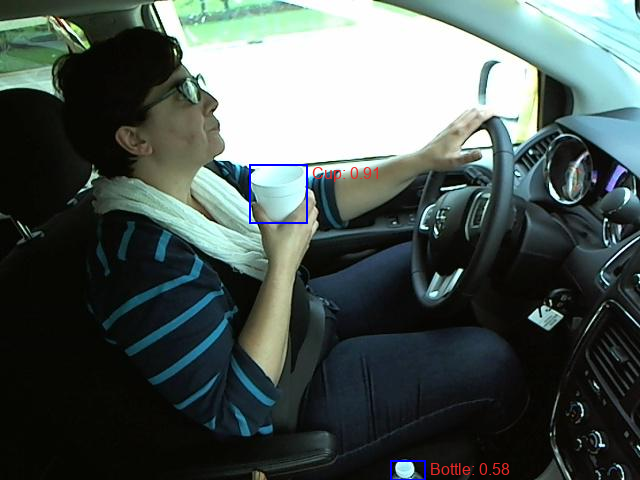


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\train\c1\img_12579.jpg: 480x640 1 person, 1 car, 1 cell phone, 1349.9ms
Speed: 3.2ms preprocess, 1349.9ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)


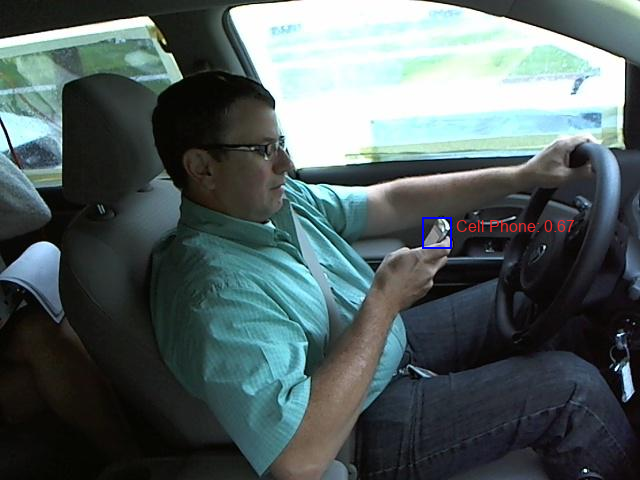


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\train\c4\img_2499.jpg: 480x640 1 person, 1 car, 1 handbag, 1 bottle, 1 cell phone, 1138.8ms
Speed: 2.0ms preprocess, 1138.8ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)


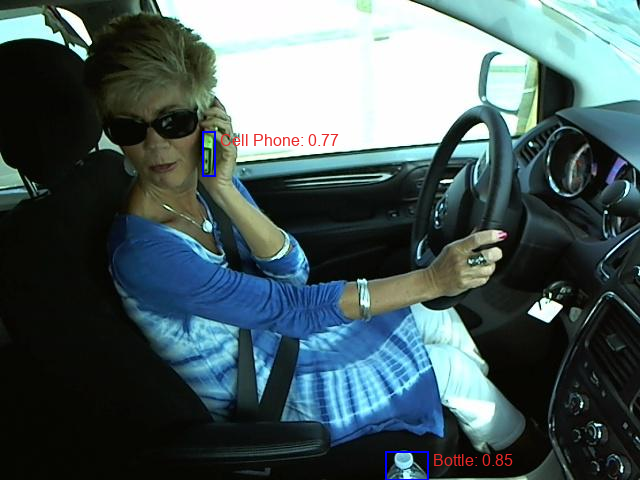


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\train\c6\img_1247.jpg: 480x640 1 person, 2 cars, 1 cup, 1 chair, 1190.6ms
Speed: 7.3ms preprocess, 1190.6ms inference, 5.6ms postprocess per image at shape (1, 3, 480, 640)


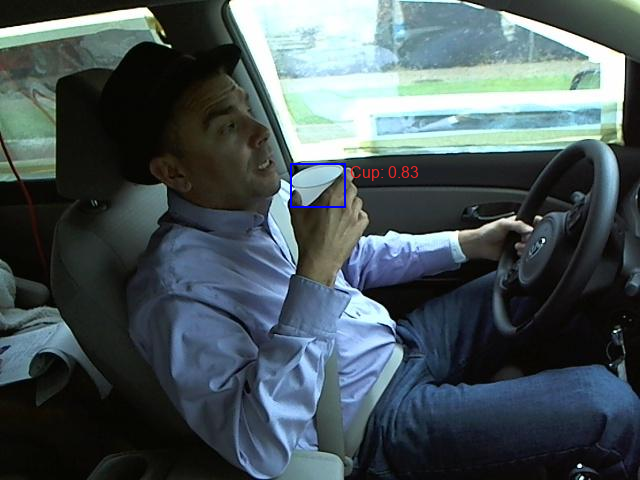

In [90]:
# Detection from train data samples
image_list = ["image_data/train/c6/img_1133.jpg","image_data/train/c6/img_2286.jpg","image_data/train/c1/img_12579.jpg","image_data/train/c4/img_2499.jpg","image_data/train/c6/img_1247.jpg"]
for img_path in image_list:
   objectDetectionModel(img_path)

#### Detection on random test image samples


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_766.jpg: 480x640 2 persons, 4 cars, 1 cell phone, 1 book, 1 clock, 1379.7ms
Speed: 2.0ms preprocess, 1379.7ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)


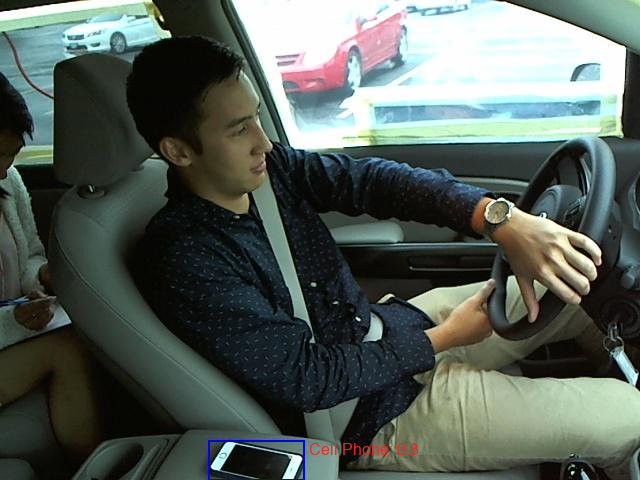


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_49.jpg: 480x640 2 persons, 1 car, 1 chair, 1 cell phone, 1 book, 1565.2ms
Speed: 3.0ms preprocess, 1565.2ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)


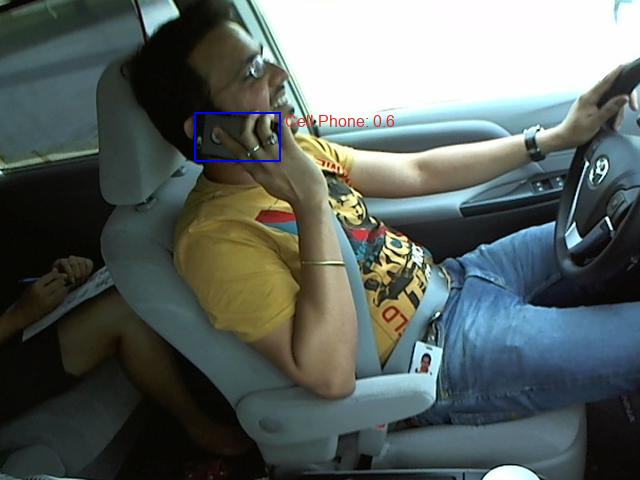


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_75.jpg: 480x640 1 person, 2 cars, 1 bench, 1 bottle, 1 cell phone, 1226.9ms
Speed: 3.0ms preprocess, 1226.9ms inference, 7.0ms postprocess per image at shape (1, 3, 480, 640)


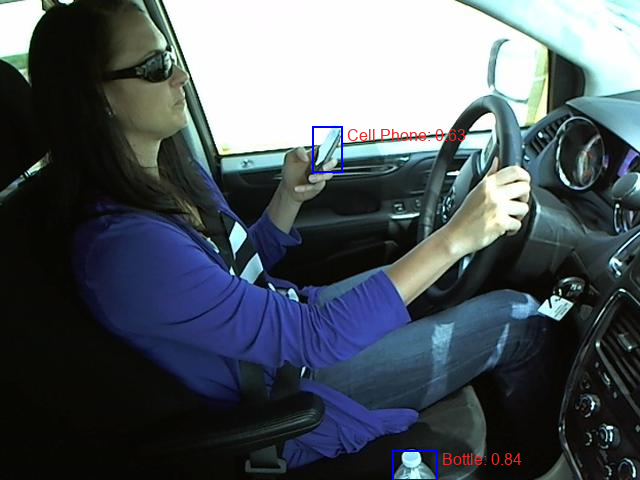


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_181.jpg: 480x640 2 persons, 1 car, 1 cup, 1 chair, 1 cell phone, 1224.7ms
Speed: 2.0ms preprocess, 1224.7ms inference, 45.5ms postprocess per image at shape (1, 3, 480, 640)


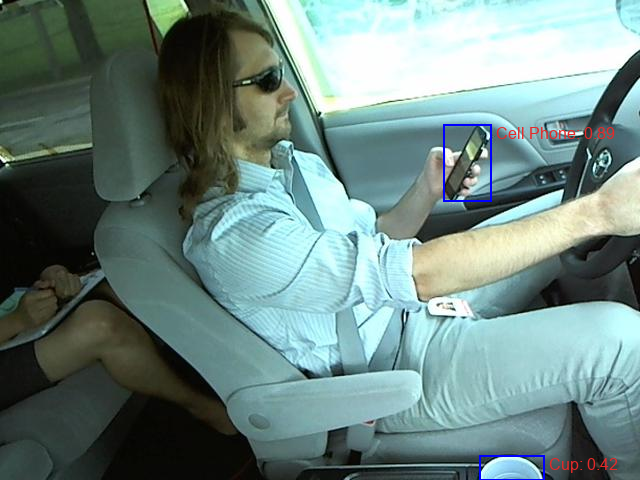


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_738.jpg: 480x640 1 person, 1 car, 1 handbag, 1 cup, 1 chair, 1247.8ms
Speed: 3.2ms preprocess, 1247.8ms inference, 2.8ms postprocess per image at shape (1, 3, 480, 640)


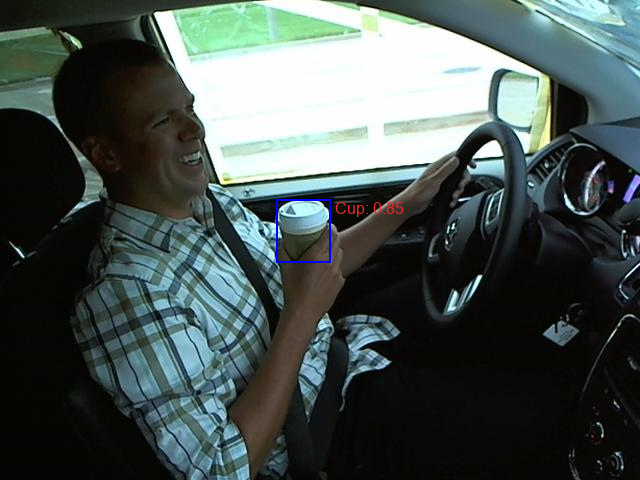

In [58]:
# Detection from random test samples 
test_img_list = ["image_data/test/img_766.jpg","image_data/test/img_49.jpg","image_data/test/img_75.jpg","image_data/test/img_181.jpg","image_data/test/img_738.jpg"]
for test_img in test_img_list:
 objectDetectionModel(test_img)

### Incorrect detections

image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_4.jpg: 480x640 1 person, 1 car, 1 bench, 1 chair, 1 cell phone, 1816.5ms
Speed: 13.5ms preprocess, 1816.5ms inference, 12.8ms postprocess per image at shape (1, 3, 480, 640)


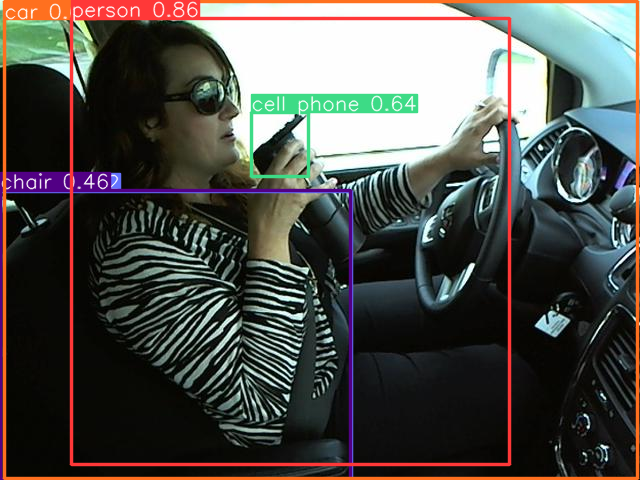

In [83]:
test_img_list2 = "image_data/test/img_4.jpg"
# objectDetectionModel(test_img_list2)
results= model(test_img_list2)
Image.fromarray(results[0].plot()[:,:,::-1])
# res_img.show()


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_53.jpg: 480x640 2 persons, 1 car, 1 handbag, 1 chair, 1 book, 2077.1ms
Speed: 6.2ms preprocess, 2077.1ms inference, 6.1ms postprocess per image at shape (1, 3, 480, 640)


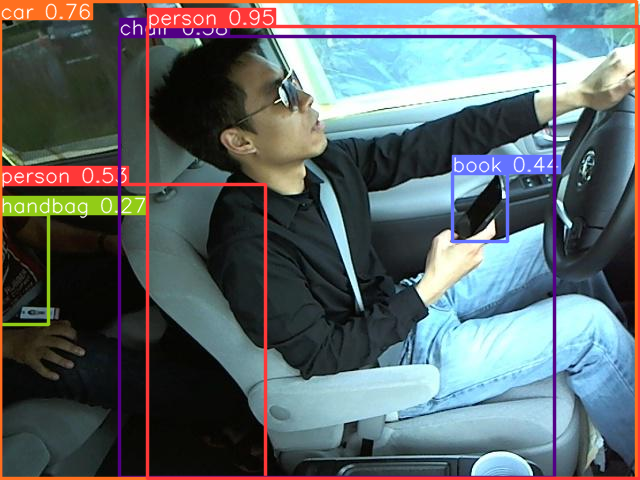

In [79]:
img2="image_data/test/img_53.jpg"
results = model(img2)
Image.fromarray(results[0].plot()[:,:,::-1])


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_110.jpg: 480x640 1 person, 1 car, 2095.0ms
Speed: 5.6ms preprocess, 2095.0ms inference, 5.2ms postprocess per image at shape (1, 3, 480, 640)


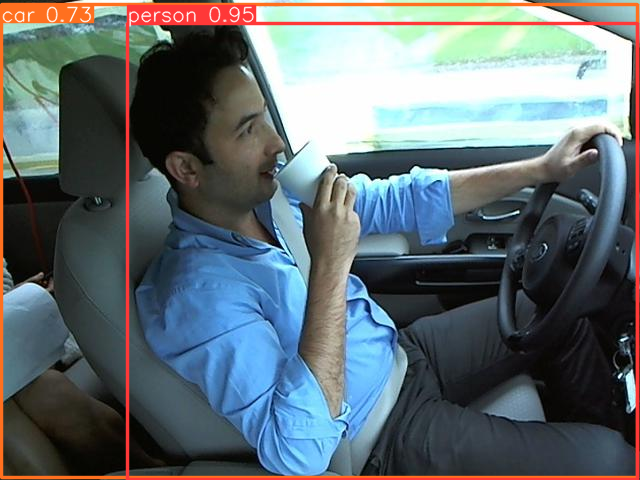

In [80]:
img3 = "image_data/test/img_110.jpg"
results = model(img3)
Image.fromarray(results[0].plot()[:,:,::-1])


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_618.jpg: 480x640 1 person, 1 car, 1 truck, 1 tie, 1 chair, 2149.4ms
Speed: 6.0ms preprocess, 2149.4ms inference, 6.1ms postprocess per image at shape (1, 3, 480, 640)


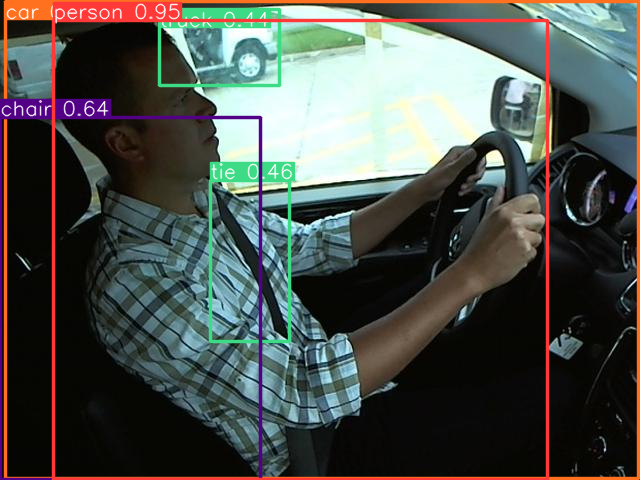

In [81]:
img4 = "image_data/test/img_618.jpg"
results = model(img4)
Image.fromarray(results[0].plot()[:,:,::-1])


image 1/1 g:\MS\Spring sem 2024\CSCI 6527 - Computer Vision\Project\image_data\test\img_123.jpg: 480x640 1 person, 1 car, 1 cell phone, 1623.1ms
Speed: 5.0ms preprocess, 1623.1ms inference, 7.0ms postprocess per image at shape (1, 3, 480, 640)


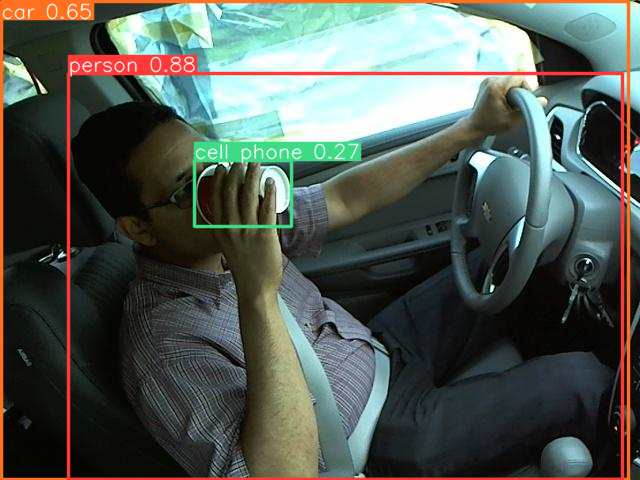

In [94]:
img4 = "image_data/test/img_123.jpg"
results = model(img4)
Image.fromarray(results[0].plot()[:,:,::-1])